In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

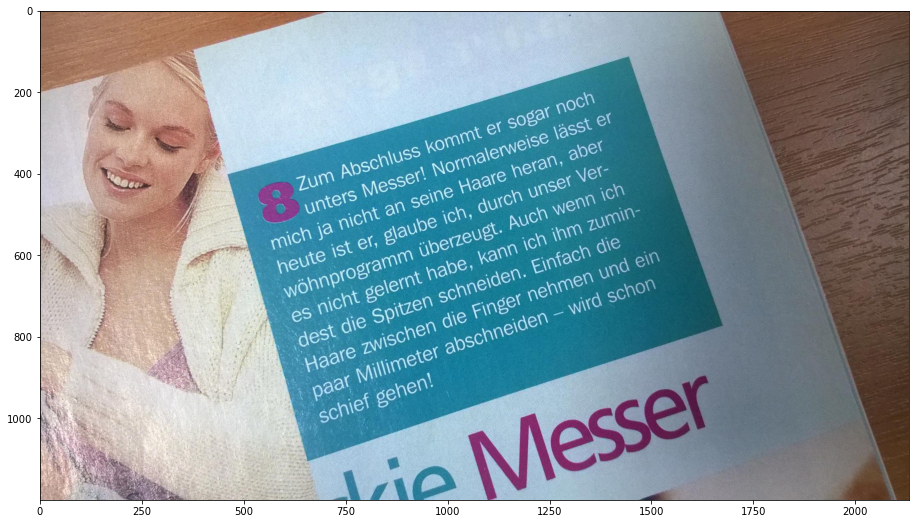

In [21]:
image = cv.cvtColor(cv.imread("images/5.jpg"),cv.COLOR_BGR2RGB)
plt.figure(figsize = (16, 9))
plt.imshow(image)
plt.show()

In [22]:
def fht(image, start, end, width):
    result = np.zeros([width, end - start])
    if end - start == 1:
        result[:, 0]=image[:, start]
    else:
        half1 = fht(image, start, (start + end) // 2, width)
        half2 = fht(image, (start + end) // 2, end, width)
        for i in range(width):
            for shift in range(end - start):
                result[i, shift] = (half1[i, shift // 2] + half2[(i +shift // 2 + shift % 2) % width, shift // 2])//2
    return result

In [23]:
def fht2d(image):
    img_size = 1
    while img_size * 2 <= np.min((image.shape[0], image.shape[1])):
        img_size *= 2
    res= fht(image[:img_size, -img_size:], 0, img_size, img_size)
    res = res / res.max()
    return res

In [24]:
def fht3d(image):
    red = fht2d(image[:, :, 0])
    green = fht2d(image[:, :, 1])    
    blue = fht2d(image[:, :, 2])
    result = np.zeros((red.shape[0], red.shape[1], 3))
    result[:, :, 0] = red
    result[:, :, 1] = green    
    result[:, :, 2] = blue  
    return result

In [32]:
res = fht3d(image)

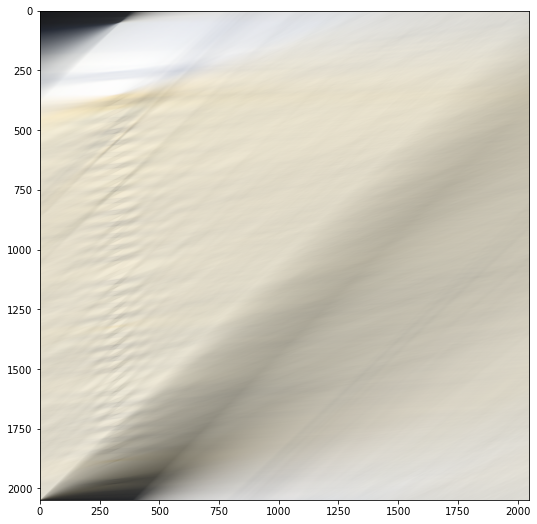

In [40]:
plt.figure(figsize = (16, 9))
plt.imshow(res)
plt.show()

In [27]:
def get_angle(hough_image):
    disps1 = np.var(hough_image[:, :, 0], axis = 1)
    angle1 = (np.argmax(disps1) - hough_image.shape[0] / 2) / hough_image.shape[0] * 2 * 45
    disps2 = np.var(hough_image[:, :, 1], axis = 1)
    angle2 = (np.argmax(disps2) - hough_image.shape[0] / 2) / hough_image.shape[0] * 2 * 45
    disps3 = np.var(hough_image[:, :, 2], axis = 1)
    angle3 = (np.argmax(disps3) - hough_image.shape[0] / 2) / hough_image.shape[0] * 2 * 45
    return -(angle1 + angle2 + angle3) / 3

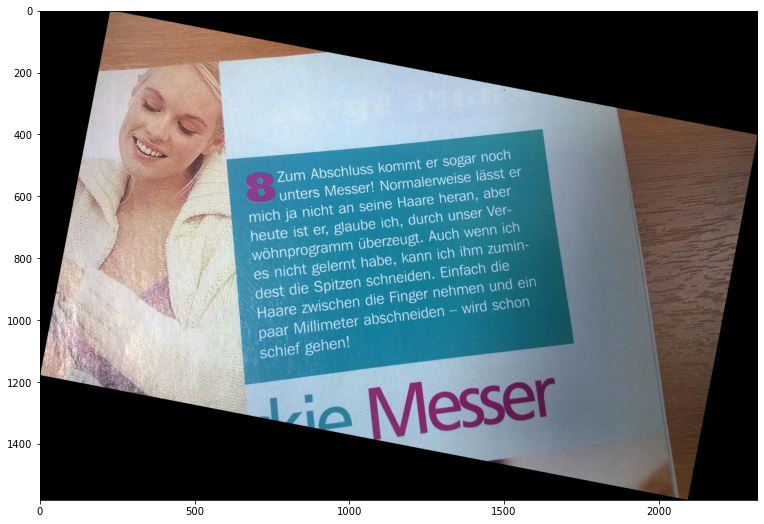

In [28]:
from scipy import ndimage

rotated = ndimage.rotate(image, get_angle(res))
plt.figure(figsize = (16, 9))
plt.imshow(rotated)
plt.show()

In [29]:
import os
from time import time
from tqdm.notebook import tqdm
from shutil import rmtree

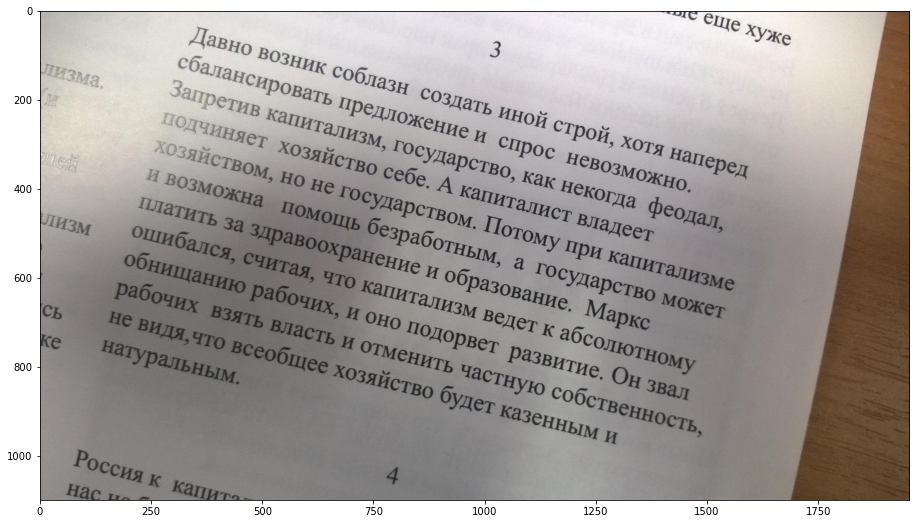

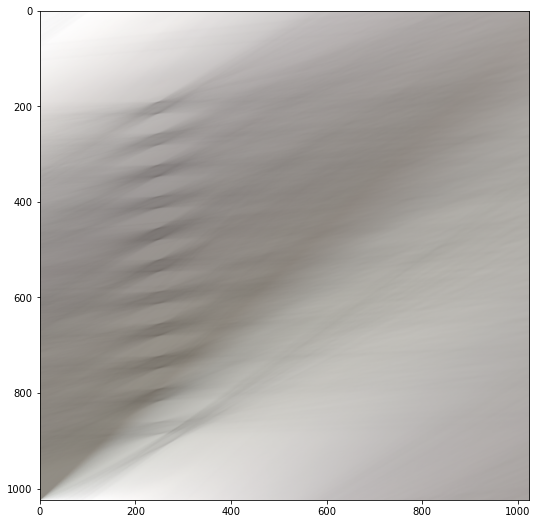

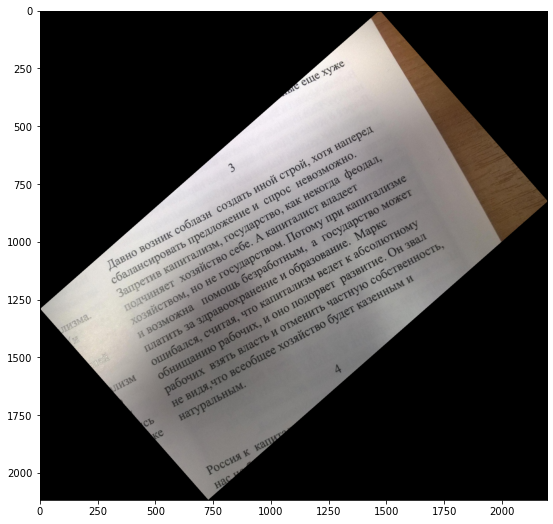

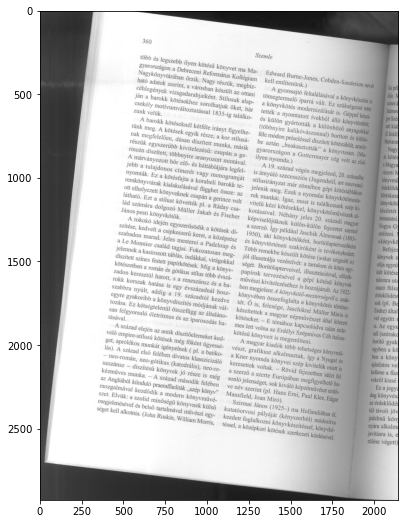

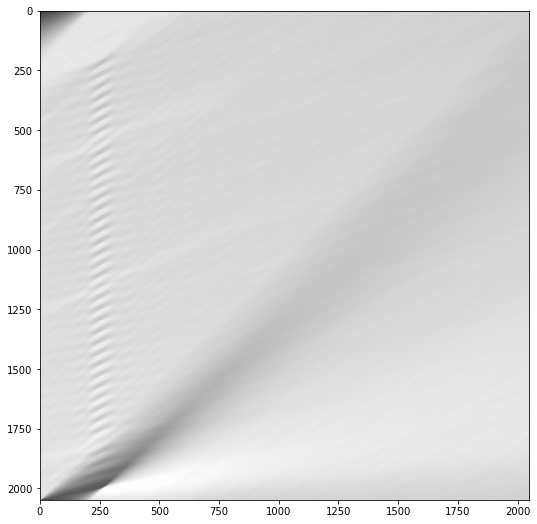

...

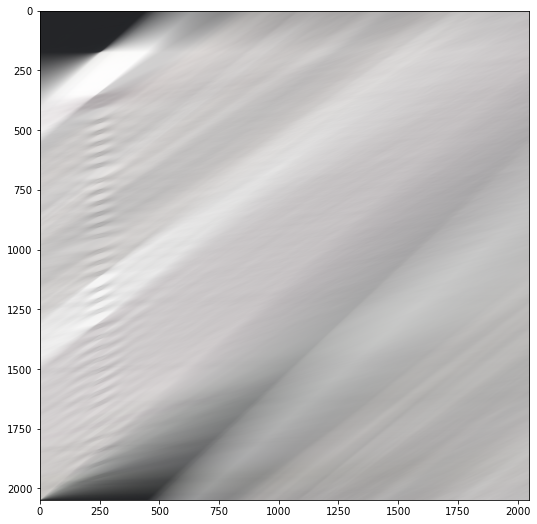

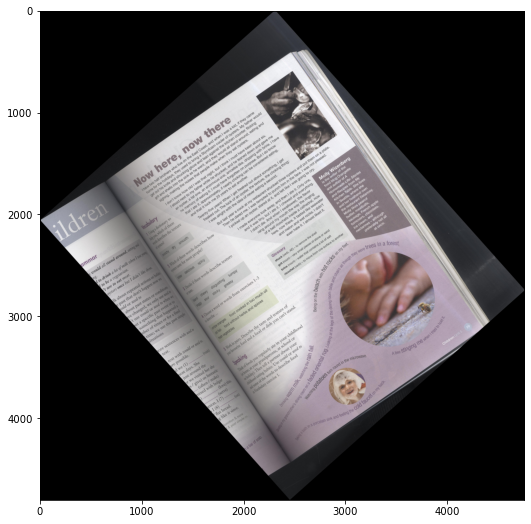

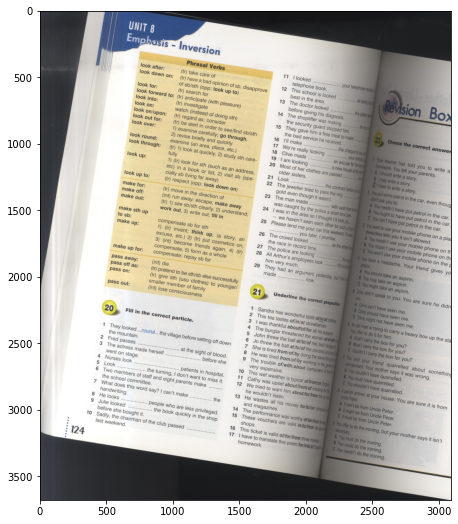

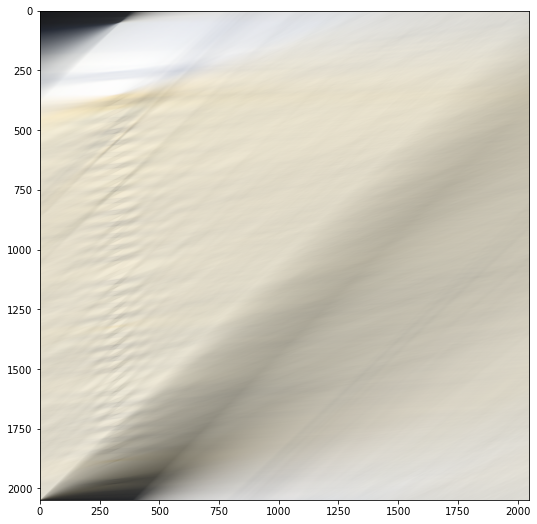

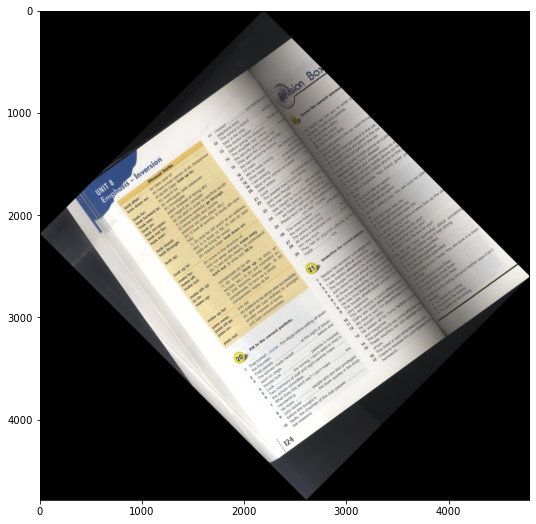


Среднее время на мегапиксель -  35319.87905489586


In [30]:
times = []
rmtree("Result/", ignore_errors=True)
os.mkdir("Result")
for image_name in tqdm(os.listdir('images\\')):
    start = time()
    image = cv.cvtColor(cv.imread("images\\" + image_name), cv.COLOR_BGR2RGB)
    plt.figure(figsize = (16, 9))
    plt.imshow(image)
    plt.show()
    res = fht3d(image)
    plt.figure(figsize = (16, 9))
    plt.imshow(res)
    plt.show()
    rotated = ndimage.rotate(image, get_angle(res))
    plt.figure(figsize = (16, 9))
    plt.imshow(rotated)
    plt.show()
    cv.imwrite("Result\\" + image_name, rotated)
    times.append((time() - start) * 1000/ res.shape[0] / res.shape[1] * 1000000)
print("Среднее время на мегапиксель - ", np.mean(times))

## Результаты
К сожалению, не всегда результат соответствует ожиданию, но в целом поворачивает.
Приблизительная асимптотика $O(N^2\log N)$ без учета векторных операций (сложение массивов)
Время обработки одного мегапикселя примерно 35 секунд